<a href="https://colab.research.google.com/github/legendorz/CNN_name_recognization/blob/main/NameRecognization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Step 0:匯入套件

In [1]:
from platform import python_version
import os, datetime
import shutil
import numpy as np
import pandas as pd
import PIL.Image
from matplotlib import pyplot as plt
from matplotlib.font_manager import findfont, FontProperties
'''
繁體中文顯示設定
'''
from matplotlib.font_manager import FontProperties

default_type = findfont( FontProperties( family=FontProperties().get_family() ) )
ttf_path = '/'.join( default_type.split('/')[:-1] )  # 預設字型的資料夾路徑 

os.chdir( '/content' )
if not os.path.exists( '/content/matplotlib_Display_Chinese_in_Colab' ):
    !git clone https://github.com/YenLinWu/matplotlib_Display_Chinese_in_Colab

os.chdir( '/content/matplotlib_Display_Chinese_in_Colab' )
for item in os.listdir():  
    if item.endswith( '.ttf' ):
        msj_ttf_path = os.path.abspath( item ) 
        msj_name = msj_ttf_path.split('/')[-1] 

try:  
    shutil.move( msj_ttf_path, ttf_path )
except: 
    pass
finally:
    os.chdir( '/content' )
    shutil.rmtree( '/content/matplotlib_Display_Chinese_in_Colab' )
font = FontProperties( fname=ttf_path+'/'+msj_name )

import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, img_to_array
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout  
from tensorflow.keras.optimizers import *
import keras.callbacks as callbacks
from keras.callbacks import ModelCheckpoint

print( 'Python Version: ', python_version() )
print( 'TensorFlow Version: ', tf.__version__ )
print( 'Keras Version: ', tf.keras.__version__ )

Cloning into 'matplotlib_Display_Chinese_in_Colab'...
remote: Enumerating objects: 15, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 15 (delta 3), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (15/15), done.
Python Version:  3.7.10
TensorFlow Version:  2.4.1
Keras Version:  2.4.0


# Step 1:下載繁體中文手寫資料集

In [2]:
!git clone https://github.com/AI-FREE-Team/Traditional-Chinese-Handwriting-Dataset.git

Cloning into 'Traditional-Chinese-Handwriting-Dataset'...
remote: Enumerating objects: 162, done.
remote: Counting objects: 100% (144/144), done.
remote: Compressing objects: 100% (137/137), done.
remote: Total 162 (delta 67), reused 22 (delta 6), pack-reused 18
Receiving objects: 100% (162/162), 77.40 MiB | 27.98 MiB/s, done.
Resolving deltas: 100% (69/69), done.


In [3]:
import os
import zipfile
import shutil

OutputFolder = '/content/Handwritten_Data'

In [4]:
if not os.path.exists(OutputFolder):
  os.mkdir(OutputFolder)
  print( f'Create the new "{OutputFolder}" folder' )

os.chdir(OutputFolder)

### 檢查路徑
!pwd

Create the new "/content/Handwritten_Data" folder
/content/Handwritten_Data


In [5]:
CompressedFiles = []

os.chdir('/content/Traditional-Chinese-Handwriting-Dataset/data')

for item in os.listdir():  
  if item.endswith('.zip'): # Check for ".zip" extension.
    file_path = os.path.abspath(item) # Get full path of the compressed file. 
    CompressedFiles.append(file_path)

for file in CompressedFiles:     
  # Construct a ZipFile object with the filename, and then extract it.
  zip_ref = zipfile.ZipFile(file).extractall(OutputFolder) 
  
  source_path = OutputFolder + '/cleaned_data(50_50)'
  img_list = os.listdir(source_path)

  for img in img_list:
      shutil.move(source_path + '/' + img, OutputFolder) # Move a file to another location. 
  
  shutil.rmtree(OutputFolder + '/cleaned_data(50_50)') 
  print(f'Decompress successfully {file} ......')

print( 'Moving images according to traditional Chinese characters......' )

ImageList = os.listdir(OutputFolder)
ImageList = [img for img in ImageList if len(img)>1]
WordList = list(set([w.split('_')[0] for w in ImageList]))

for w in WordList:
  try:
    os.chdir(OutputFolder) # Change the current working directory to OutputPath.
    os.mkdir(w) # Create the new word folder in OutputPath.
    MoveList = [img for img in ImageList if w in img]
                
  except: 
    os.chdir(OutputFolder)
    MoveList = [ img for img in ImageList if w in img ]
  
  finally:            
    for img in MoveList:
      old_path = OutputFolder + '/' + img
      new_path = OutputFolder + '/' + w + '/' + img
      shutil.move( old_path, new_path )

print( 'Data Deployment completed.' )

Decompress successfully /content/Traditional-Chinese-Handwriting-Dataset/data/cleaned_data(50_50)-20200420T071507Z-001.zip ......
Decompress successfully /content/Traditional-Chinese-Handwriting-Dataset/data/cleaned_data(50_50)-20200420T071507Z-002.zip ......
Decompress successfully /content/Traditional-Chinese-Handwriting-Dataset/data/cleaned_data(50_50)-20200420T071507Z-003.zip ......
Decompress successfully /content/Traditional-Chinese-Handwriting-Dataset/data/cleaned_data(50_50)-20200420T071507Z-004.zip ......
Moving images according to traditional Chinese characters......
Data Deployment completed.


In [6]:
a=0
b=0

for item in os.listdir(OutputFolder):
  a += 1
  for i in os.listdir(OutputFolder + '/' + item):
    b +=1


print('總共: ' + str(a) + ' 個字(資料夾) / 總共: ' + str(b) + '個樣本')
print('平均每個字有: ' + str(b/a) + ' 個樣本')

總共: 4803 個字(資料夾) / 總共: 250712個樣本
平均每個字有: 52.19904226525089 個樣本


# Step 2: 訓練集

In [7]:
os.chdir('/content')
RawDataPath = '/content/Traditional_Chinese_Testing_Data'

if not os.path.exists(RawDataPath):
  os.mkdir(RawDataPath)

os.chdir(RawDataPath)
print( 'Current working directory:', os.getcwd() )

Current working directory: /content/Traditional_Chinese_Testing_Data


##訓練集
從繁體中文手寫資料集中，選擇欲辨識的繁體中文字集，作為訓練集。

In [8]:
DataPath = '/content/Traditional_Chinese_Testing_Data/Handwriting-Chinese-Characters-Recognition/'

if not os.path.exists( DataPath ):
    os.mkdir( DataPath ) 
  
os.chdir(DataPath)
print( 'Current working directory:', os.getcwd() )

Current working directory: /content/Traditional_Chinese_Testing_Data/Handwriting-Chinese-Characters-Recognition


In [9]:
SelectedWords = [ '江' , '政', '倫']

TraningDataPath = '/content/Traditional_Chinese_Testing_Data/Handwriting-Chinese-Characters-Recognition/train data'
if not os.path.exists( TraningDataPath ):
    os.mkdir( TraningDataPath ) 
else:
    shutil.rmtree( TraningDataPath )
    os.mkdir( TraningDataPath )     

for c in SelectedWords:
    shutil.copytree( OutputFolder+'/'+c, TraningDataPath+'/'+c )


江 總共 51 張照片，顯示前 10 張
政 總共 51 張照片，顯示前 10 張
倫 總共 51 張照片，顯示前 10 張


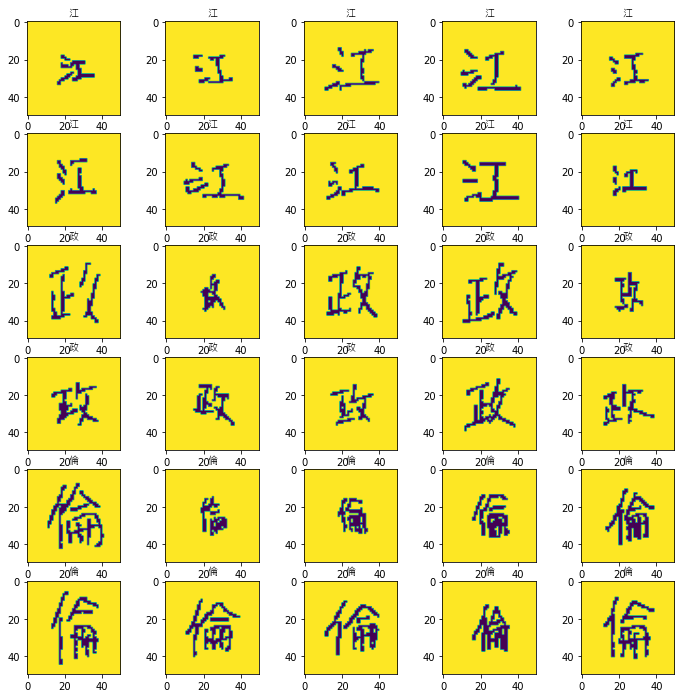

In [10]:

def Loading_Image( image_path ):
    img = load_img( image_path, color_mode='grayscale'  )  
    img = tf.constant( np.array(img) )  
    return img

def Show( image, title=None ) :
    if len( image.shape )>3 :
        image = tf.squeeze( image, axis=0 )   

    plt.imshow( image )
    if title:
        plt.title( title, fontproperties=font )

img_list = []
for c in SelectedWords :
    folder_path = TraningDataPath+'/'+c
    file_names = os.listdir( folder_path )
    temp = 10
    print(f'{c} 總共 {len(file_names)} 張照片，顯示前 {temp} 張')
    for i in range(temp) :
        img_list.append( folder_path+'/'+file_names[i] )

plt.gcf().set_size_inches( (12,12) ) 
for i in range(len(img_list)):      
    plt.subplot(len(img_list)/5,5,i+1)
    title = img_list[i].split('/')[-1].split('_')[-2]
    img = Loading_Image( img_list[i])
    Show( img, title )




# Step 3: 資料擴增( Data Augmentation )


##(3.0)(超)參數

In [11]:
Num_Classes = len(SelectedWords)
Image_Size = ( 50, 50 )
Epochs = 30
Batch_Size = 7

## (3.1) 訓練集

In [12]:
Train_Data_Genetor = ImageDataGenerator( rescale = 1./255, validation_split = 0.2,
                                         width_shift_range = 0.05,   
                                         height_shift_range = 0.05,
                                         zoom_range = 0.3,  
                                         horizontal_flip = False)

In [13]:
Train_Generator = Train_Data_Genetor.flow_from_directory( TraningDataPath ,
                                                          target_size = Image_Size,
                                                          batch_size = Batch_Size,
                                                          class_mode = 'categorical',
                                                          shuffle = True, 
                                                          subset = 'training' )

Found 123 images belonging to 3 classes.


batch 1: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


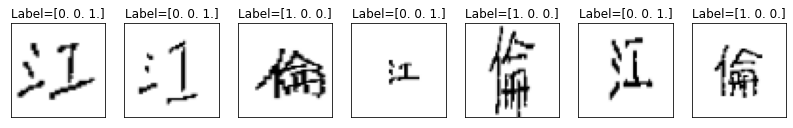

batch 2: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


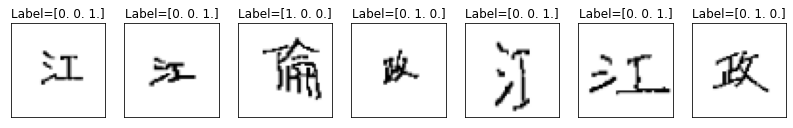

batch 3: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


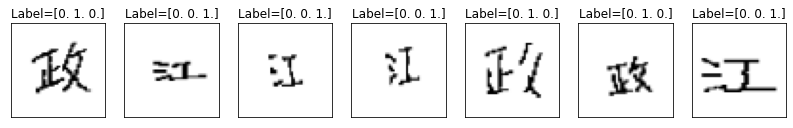

batch 4: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


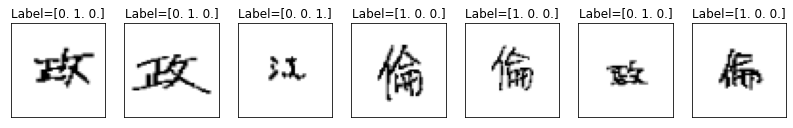

batch 5: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


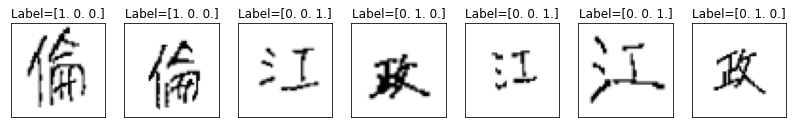

batch 6: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


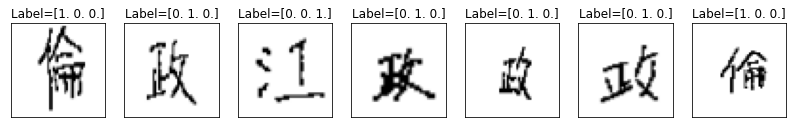

batch 7: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


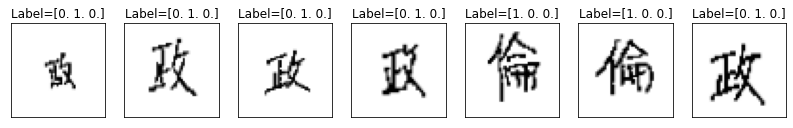

batch 8: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


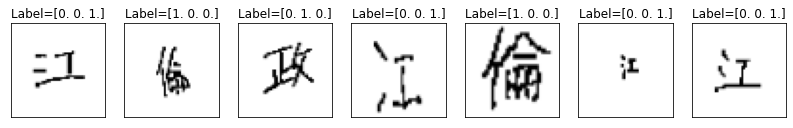

batch 9: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


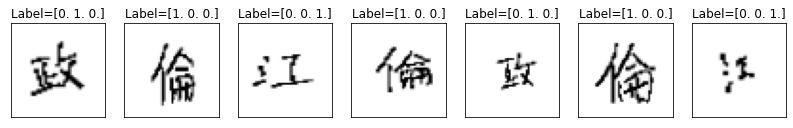

batch 10: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


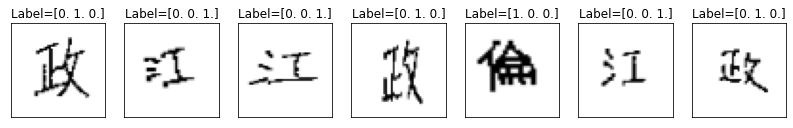

batch 11: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


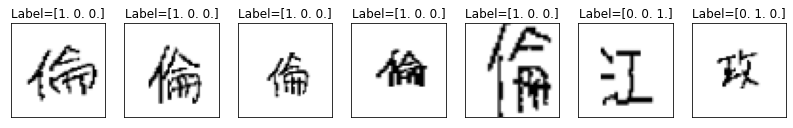

batch 12: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


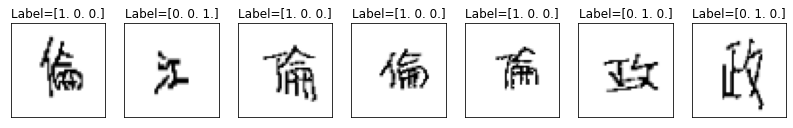

batch 13: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


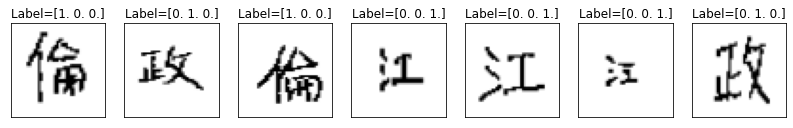

batch 14: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


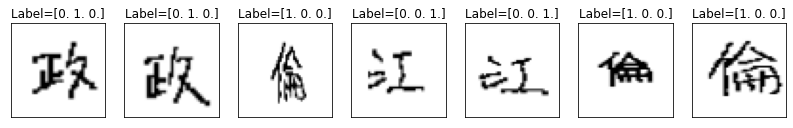

batch 15: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


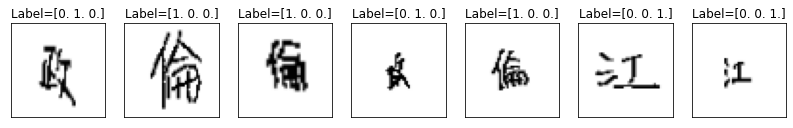

batch 16: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


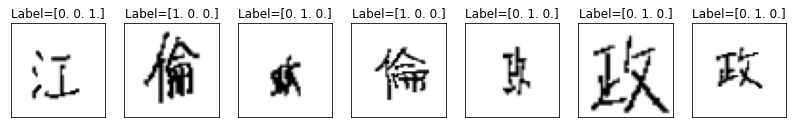

batch 17: 
 shape of images: (7, 50, 50, 3) 
 shape of labels: (7, 3)


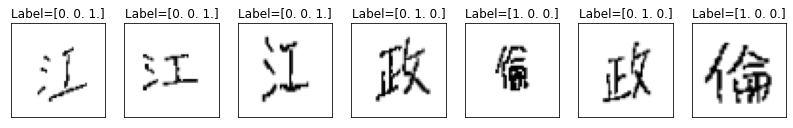

batch 18: 
 shape of images: (4, 50, 50, 3) 
 shape of labels: (4, 3)


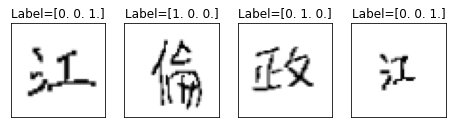

There are 18 batches.


In [14]:
def Plot_Genetor( imgs, labels=[], grid=(1,10), size=(20,2) ):
    n = len( imgs )             
    plt.gcf().set_size_inches(size) 
    for i in range(n):           
        ax = plt.subplot( grid[0], grid[1], i+1 )   
        ax.imshow( imgs[i] )            
        if len(labels):
            ax.set_title( f'Label={labels[i]}' )   
        ax.set_xticks([]); ax.set_yticks([]) 
    plt.show()  

batch = 1
for data, label in Train_Generator:
    print( f'batch {batch}: \n shape of images: {data.shape} \n shape of labels: {label.shape}' )
    Plot_Genetor( data, label )
    batch += 1
    if batch > len(Train_Generator): 
        break

print( f'There are {len(Train_Generator)} batches.' )

## (3.2) 測試集

In [15]:
Val_Data_Genetor = ImageDataGenerator( rescale=1./255, validation_split = 0.2 )

In [16]:
Val_Generator = Train_Data_Genetor.flow_from_directory( TraningDataPath ,
                                                        target_size = Image_Size,
                                                        batch_size = Batch_Size,
                                                        class_mode = 'categorical',
                                                        shuffle = True, 
                                                        subset = 'validation' )

Found 30 images belonging to 3 classes.


# Step 4: 建立及編譯模型

In [ ]:
CNN = Sequential( name = 'CNN_Model' )
CNN.add( Conv2D( 6, kernel_size = (5, 5), padding = 'same', activation='relu', 
                 input_shape = (Image_Size[0], Image_Size[1], 3), name = 'Convolution' ) )
CNN.add( MaxPooling2D( pool_size = (2,2), name = 'Pooling' ) )
CNN.add( Conv2D( 10, kernel_size = (3,3), padding = 'same', activation='relu', 
                 input_shape = (Image_Size[0], Image_Size[1],3), name = 'Convolution_2' ) )
CNN.add( MaxPooling2D( pool_size = (2,2), name = 'Pooling_2' ) )
CNN.add( Conv2D( 20, kernel_size = (3,3), padding = 'same', activation='relu', 
                 input_shape = (Image_Size[0], Image_Size[1],3), name = 'Convolution_3' ) )
CNN.add( MaxPooling2D( pool_size = (2,2), name = 'Pooling_3' ) )
CNN.add( Dropout( 0.2, name = 'Dropout_1' ) )
CNN.add( Flatten( name = 'Flatten' ) )
CNN.add( Dense( 512, activation = 'relu', name = 'Dense' ) )
CNN.add( Dense( Num_Classes, activation = 'softmax', name = 'Softmax' ) )
CNN.summary()

CNN.compile( optimizer = Adam(),
             loss = 'categorical_crossentropy', 
             metrics = ['accuracy'] )

Model: "CNN_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Convolution (Conv2D)         (None, 50, 50, 6)         456       
_________________________________________________________________
Pooling (MaxPooling2D)       (None, 25, 25, 6)         0         
_________________________________________________________________
Convolution_2 (Conv2D)       (None, 25, 25, 10)        550       
_________________________________________________________________
Pooling_2 (MaxPooling2D)     (None, 12, 12, 10)        0         
_________________________________________________________________
Convolution_3 (Conv2D)       (None, 12, 12, 20)        1820      
_________________________________________________________________
Pooling_3 (MaxPooling2D)     (None, 6, 6, 20)          0         
_________________________________________________________________
Dropout_1 (Dropout)          (None, 6, 6, 20)          0 

In [ ]:
CNN = Sequential( name = 'CNN_Model' )
CNN.add( Conv2D( 5, kernel_size = (3,3), padding = 'same', activation='relu', 
                 input_shape = (Image_Size[0], Image_Size[1],3), name = 'Convolution' ) )
CNN.add( MaxPooling2D( pool_size = (2,2), name = 'Pooling' ) )
CNN.add( Flatten( name = 'Flatten' ) )
CNN.add( Dropout( 0.5, name = 'Dropout_1' ) )
CNN.add( Dense( 512, activation = 'relu', name = 'Dense' ) )
CNN.add( Dropout( 0.5, name = 'Dropout_2' ) )
CNN.add( Dense( Num_Classes, activation = 'softmax', name = 'Softmax' ) )
CNN.summary()

CNN.compile( optimizer = Adam(),
             loss = 'categorical_crossentropy', 
             metrics = ['accuracy'] )


Model: "CNN_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Convolution (Conv2D)         (None, 50, 50, 5)         140       
_________________________________________________________________
Pooling (MaxPooling2D)       (None, 25, 25, 5)         0         
_________________________________________________________________
Flatten (Flatten)            (None, 3125)              0         
_________________________________________________________________
Dropout_1 (Dropout)          (None, 3125)              0         
_________________________________________________________________
Dense (Dense)                (None, 512)               1600512   
_________________________________________________________________
Dropout_2 (Dropout)          (None, 512)               0         
_________________________________________________________________
Softmax (Dense)              (None, 2)                 10

In [ ]:
CNN = Sequential( name = 'CNN_Model' )
CNN.add( Conv2D( 5, kernel_size = (5, 5), padding = 'same', activation='relu', 
                 input_shape = (Image_Size[0], Image_Size[1], 3), name = 'Convolution' ) )
CNN.add( MaxPooling2D( pool_size = (2,2), name = 'Pooling' ) )
CNN.add( Conv2D( 10, kernel_size = (3,3), padding = 'same', activation='relu', 
                 input_shape = (Image_Size[0], Image_Size[1],3), name = 'Convolution_2' ) )
CNN.add( MaxPooling2D( pool_size = (2,2), name = 'Pooling_2' ) )
CNN.add( Flatten( name = 'Flatten' ) )
CNN.add( Dense( 512, activation = 'relu', name = 'Dense' ) )
CNN.add( Dense( Num_Classes, activation = 'softmax', name = 'Softmax' ) )
CNN.summary()

CNN.compile(optimizer='rmsprop',       
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),   
              metrics=['accuracy'])

Model: "CNN_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Convolution (Conv2D)         (None, 50, 50, 5)         380       
_________________________________________________________________
Pooling (MaxPooling2D)       (None, 25, 25, 5)         0         
_________________________________________________________________
Convolution_2 (Conv2D)       (None, 25, 25, 10)        460       
_________________________________________________________________
Pooling_2 (MaxPooling2D)     (None, 12, 12, 10)        0         
_________________________________________________________________
Flatten (Flatten)            (None, 1440)              0         
_________________________________________________________________
Dense (Dense)                (None, 512)               737792    
_________________________________________________________________
Softmax (Dense)              (None, 3)                 15

In [ ]:
CNN = Sequential( name = 'CNN_Model' )
CNN.add(Conv2D(6, (5, 5), padding='same', input_shape = (Image_Size[0], Image_Size[1], 3), activation = 'relu'))
CNN.add(MaxPooling2D(pool_size=(2, 2)))
CNN.add(Dropout(0.5)) # antes era 0.25
# Adding a second convolutional layer
CNN.add(Conv2D(12, (4, 4), padding='same', activation = 'relu'))
CNN.add(MaxPooling2D(pool_size=(2, 2)))
CNN.add(Dropout(0.5)) # antes era 0.25
# Adding a third convolutional layer
CNN.add(Conv2D(14, (3, 3), padding='same', activation = 'relu'))
CNN.add(MaxPooling2D(pool_size=(2, 2)))
CNN.add(Dropout(0.5)) # antes era 0.25
# Step 3 - Flattening
CNN.add(Flatten())
# Step 4 - Full connection
CNN.add(Dense(units = 512, activation = 'relu'))
CNN.add(Dropout(0.5)) 
CNN.add(Dense(units = Num_Classes, activation = 'softmax'))
CNN.summary()

CNN.compile( optimizer = Adam(),
             loss = 'categorical_crossentropy', 
             metrics = ['accuracy'] )

Model: "CNN_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_21 (Conv2D)           (None, 50, 50, 6)         456       
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 25, 25, 6)         0         
_________________________________________________________________
dropout_28 (Dropout)         (None, 25, 25, 6)         0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 25, 25, 12)        1164      
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 12, 12, 12)        0         
_________________________________________________________________
dropout_29 (Dropout)         (None, 12, 12, 12)        0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 12, 12, 14)        15

# Step 5: 檢視模型成果

Epoch 1/30
17/17 [==============================] - 2s 62ms/step - loss: 1.3058 - accuracy: 0.3863 - val_loss: 1.0980 - val_accuracy: 0.4643
Epoch 2/30
17/17 [==============================] - 1s 46ms/step - loss: 1.1357 - accuracy: 0.2984 - val_loss: 1.1011 - val_accuracy: 0.3571
Epoch 3/30
17/17 [==============================] - 1s 48ms/step - loss: 1.1092 - accuracy: 0.3993 - val_loss: 1.0966 - val_accuracy: 0.2857
Epoch 4/30
17/17 [==============================] - 1s 44ms/step - loss: 1.0924 - accuracy: 0.3781 - val_loss: 1.0935 - val_accuracy: 0.3571
Epoch 5/30
17/17 [==============================] - 1s 43ms/step - loss: 1.0752 - accuracy: 0.4158 - val_loss: 1.0863 - val_accuracy: 0.5000
Epoch 6/30
17/17 [==============================] - 1s 44ms/step - loss: 1.0622 - accuracy: 0.4943 - val_loss: 1.0734 - val_accuracy: 0.4643
Epoch 7/30
17/17 [==============================] - 1s 45ms/step - loss: 1.0436 - accuracy: 0.5461 - val_loss: 1.0416 - val_accuracy: 0.5357
Epoch 8/30
17

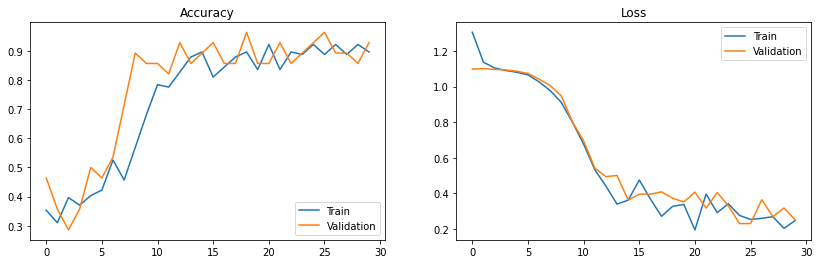

In [ ]:
earlyStopping = callbacks.EarlyStopping(monitor='val_loss', patience=5)
History = CNN.fit( Train_Generator,
                   steps_per_epoch = Train_Generator.samples//Batch_Size,
                   validation_data = Val_Generator,
                   validation_steps = Val_Generator.samples//Batch_Size,
                   epochs = Epochs,
                   callbacks=[earlyStopping] )

Train_Accuracy = History.history['accuracy']
Val_Accuracy = History.history['val_accuracy'] 
Train_Loss = History.history['loss']
Val_Loss = History.history['val_loss']
epochs_range = range(Epochs)

plt.figure( figsize=(14,4) )
plt.subplot( 1,2,1 )
plt.plot( range( len(Train_Accuracy) ), Train_Accuracy, label='Train' ) 
plt.plot( range( len(Val_Accuracy) ), Val_Accuracy, label='Validation' ) 
plt.legend( loc='lower right' )
plt.title( 'Accuracy' )

plt.subplot( 1,2,2 )
plt.plot( range( len(Train_Loss) ), Train_Loss, label='Train' )
plt.plot( range( len(Val_Loss) ), Val_Loss, label='Validation' )
plt.legend( loc='upper right' )
plt.title( 'Loss')

plt.show()

##(5.1)繪製每層卷積層訓練狀況

Convolution


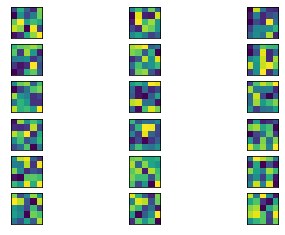

Convolution_2


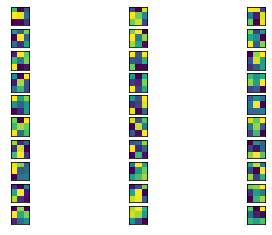

Convolution_3


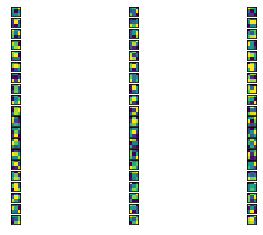

In [ ]:
for layer in CNN.layers:
    if 'Conv' in layer.name:
        weights, bias= layer.get_weights()
        print(layer.name)
        
        #normalize filter values between  0 and 1 for visualization
        f_min, f_max = weights.min(), weights.max()
        filters = (weights - f_min) / (f_max - f_min)  
        #print(filters)
        filter_cnt=1
      

        for i in range(filters.shape[3]):
            #get the filters
            filt=filters[:,:,:, i]
            #plotting each of the channel, color image RGB channels
            for j in range(3):
                ax= plt.subplot(filters.shape[3], 3, filter_cnt  )
                ax.set_xticks([])
                ax.set_yticks([])
                plt.imshow(filt[:,:,j], cmap='viridis') 
                filter_cnt+=1
        plt.show()

##(5.2)驗證資料

In [ ]:
#建立驗證資料夾
TestingDataPath = '/content/Traditional_Chinese_Testing_Data/Handwriting-Chinese-Characters-Recognition/test data'

if not os.path.exists( TestingDataPath ):
    os.mkdir( TestingDataPath ) 

os.chdir(TestingDataPath)

In [17]:
#建好後，手動放照片
from google.colab import files
files.upload()

Saving 江_006.png to 江_006.png
Saving 江_007.png to 江_007.png
Saving 江_008.png to 江_008.png
Saving 江_009.png to 江_009.png
Saving 攻_001.png to 攻_001.png
Saving 汪_001.png to 汪_001.png
Saving 侖_001.png to 侖_001.png
Saving 玟_001.png to 玟_001.png
Saving 玫_001.png to 玫_001.png
Saving 政_004.png to 政_004.png
Saving 政_005.png to 政_005.png
Saving 政_006.png to 政_006.png
Saving 政_007.png to 政_007.png
Saving 政_008.png to 政_008.png
Saving 故_001.png to 故_001.png
Saving 流_001.png to 流_001.png
Saving 倫_005.png to 倫_005.png
Saving 倫_006.png to 倫_006.png
Saving 倫_007.png to 倫_007.png
Saving 倫_008.png to 倫_008.png
Saving 倫_009.png to 倫_009.png
Saving 偷_001.png to 偷_001.png
Saving 論_001.png to 論_001.png
Saving 輪_001.png to 輪_001.png
Saving 輸_001.png to 輸_001.png


{'侖_001.png': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02g\x00\x00\x02\x97\x08\x00\x00\x00\x00\xe2K\xb2\xd4\x00\x00\x00\x04gAMA\x00\x00\xb1\x8f\x0b\xfca\x05\x00\x00\x00\xd2iCCPICC Profile\x00\x00\x18\x95c``\xacH,(\xc8a\x12``\xc8\xcd+)r\x0fr\x8c\x8c\x88\x8cR`\xbf\xca\xc0\xce\xc0\xc8\x00\x06\x89\xc9\xc5\x05\x8e\x01\x01>\x0c8\xc1\xb7k\x10\xb5\x97uAf\xe1V\x87\x15\xb0\xa4\xa4\x16\'\x03\xe9-@\\\x9a\\PT\xc2\xc0\xc0\xa8\x03d\xab\x97\x97\x14\x80\xd8!@\xb6HvH\x903\x90\x9d\x01d\xf3A\xd5\x83\x80\xb4sbNfRQbIj\x8a\x82{Qb\xa5\x82s~N~QqAbr*\x89\xae \x02\x94\xa4V\x94\x80h\xe7\xfc\x82\xca\xa2\xcc\xf4\x8c\x12\x05G\xa0oS\x81v\xe6\x16\x94\x96\xa4\x16\xe9(x\xe6%\xeb10\x80\xc2\x0f\xa2\xe3s 8\\\x18\xc5\xce$\x97\x16\x95A\x8dad2f`\x00\x00\x11]4\xc5\x1dy\xd3\x91\x00\x00\x00 cHRM\x00\x00z&\x00\x00\x80\x84\x00\x00\xfa\x00\x00\x00\x80\xe8\x00\x00u0\x00\x00\xea`\x00\x00:\x98\x00\x00\x17p\x9c\xbaQ<\x00\x00\x00xeXIfMM\x00*\x00\x00\x00\x08\x00\x05\x01\x12\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x01\x1a\x00\x05\x0

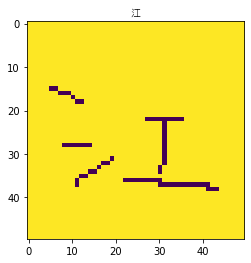

In [ ]:
pict = '江_001'
img_path= f'/content/Traditional_Chinese_Testing_Data/Handwriting-Chinese-Characters-Recognition/test data/{pict}.png' 
img = Loading_Image( img_path)
title = img_path.split('/')[-1].split('_')[-2]
Show( img, title )

##(5.3)驗證模型每層學習狀況

江：左邊第一撇筆畫；政：右下角最後一撇；倫：右邊頂蓋

(1, 25, 25, 6)
(1, 25, 25, 6)
(1, 25, 25, 12)
(1, 12, 12, 12)
(1, 12, 12, 12)
(1, 12, 12, 12)
(1, 6, 6, 12)
(1, 6, 6, 12)
(1, 432)
(1, 512)
(1, 512)
(1, 3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: invalid value encountered in true_divide


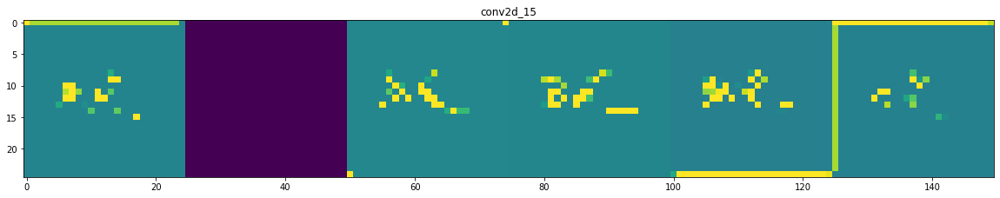

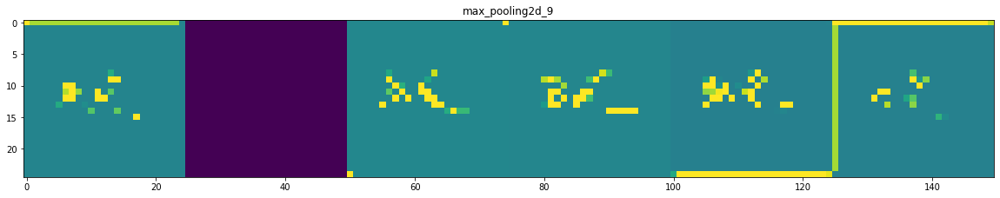

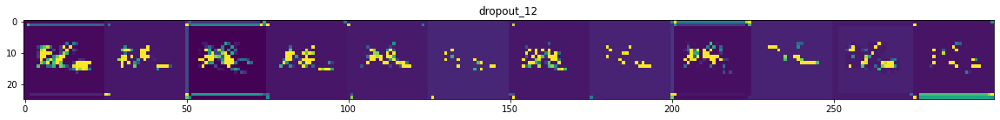

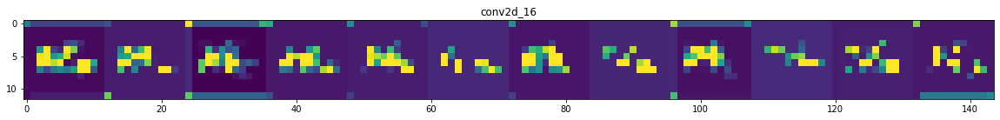

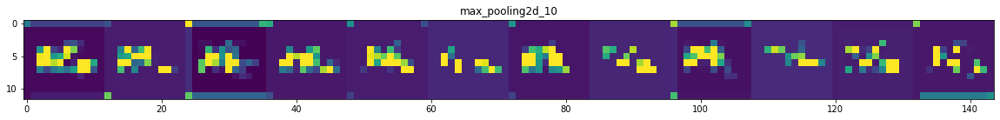

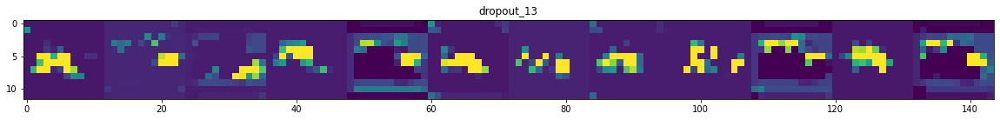

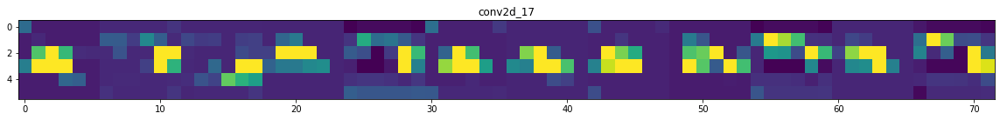

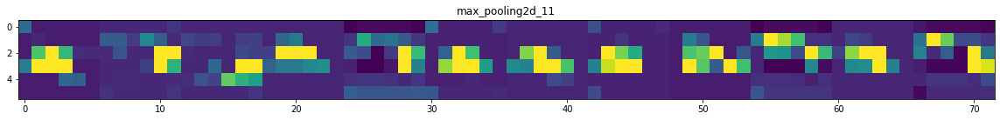

In [ ]:
pict = '政_005'
img_path= f'/content/Traditional_Chinese_Testing_Data/Handwriting-Chinese-Characters-Recognition/test data/{pict}.png'

successive_outputs = [layer.output for layer in CNN.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs = CNN.input, outputs = successive_outputs)
#Load the input image
img = load_img(img_path, target_size=(50, 50))


# Convert ht image to Array of dimension (150,150,3)
x   = img_to_array(img)                           
x   = x.reshape((1,) + x.shape)
# Rescale by 1/255
x /= 255.0
# Let's run input image through our vislauization network
# to obtain all intermediate representations for the image.
successive_feature_maps = visualization_model.predict(x)
# Retrieve are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in CNN.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  print(feature_map.shape)
  if len(feature_map.shape) == 4:
    
    # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers
   
    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)
    
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    
    # Postprocess the feature to be visually palatable
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      # Tile each filter into a horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
# Display the grid
    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )

##(5.4)儲存模型

In [ ]:
os.chdir( '/content' )
CNN.save( 'CNN_3C.h5')

In [ ]:
for img, i in zip(sorted(os.listdir()), range(len(os.listdir()))):
    pic = load_img(img, target_size=(50, 50))
    wrd = img[0]
    test_image = np.expand_dims(image.img_to_array(pic), axis = 0)
    predict = CNN.predict(test_image)
    print(img, predict)

何_001.png [[0. 0. 1.]]
侖_001.png [[0. 1. 0.]]
倫_001.png [[1. 0. 0.]]
倫_002.png [[1. 0. 0.]]
倫_003.png [[1. 0. 0.]]
倫_004.png [[0. 1. 0.]]
倫_005.png [[1. 0. 0.]]
倫_006.png [[0. 1. 0.]]
倫_007.png [[0. 1. 0.]]
倫_008.png [[0. 0. 1.]]
倫_009.png [[0. 1. 0.]]
偷_001.png [[0. 1. 0.]]
攻_001.png [[0. 0. 1.]]
政_001.png [[0. 1. 0.]]
政_002.png [[0. 1. 0.]]
政_003.png [[0. 1. 0.]]
政_004.png [[0. 1. 0.]]
政_005.png [[0. 0. 1.]]
政_006.png [[0. 0. 1.]]
政_007.png [[0. 0. 1.]]
政_008.png [[0. 0. 1.]]
故_001.png [[0. 1. 0.]]
江_001.png [[0. 0. 1.]]
江_002.png [[0. 0. 1.]]
江_003.png [[0. 0. 1.]]
江_004.png [[0. 0. 1.]]
江_005.png [[0. 0. 1.]]
江_006.png [[0. 0. 1.]]
江_007.png [[0. 1. 0.]]
江_008.png [[0. 0. 1.]]
江_009.png [[0. 0. 1.]]
汪_001.png [[0. 0. 1.]]
河_001.png [[0. 0. 1.]]
流_001.png [[0. 1. 0.]]
涂_001.png [[0. 0. 1.]]
玟_001.png [[0.0000000e+00 1.0000000e+00 6.5807296e-34]]
玫_001.png [[0. 1. 0.]]
論_001.png [[0. 0. 1.]]
輪_001.png [[1. 0. 0.]]
輸_001.png [[0. 1. 0.]]


In [ ]:
name.split('_')[0]

'輸'

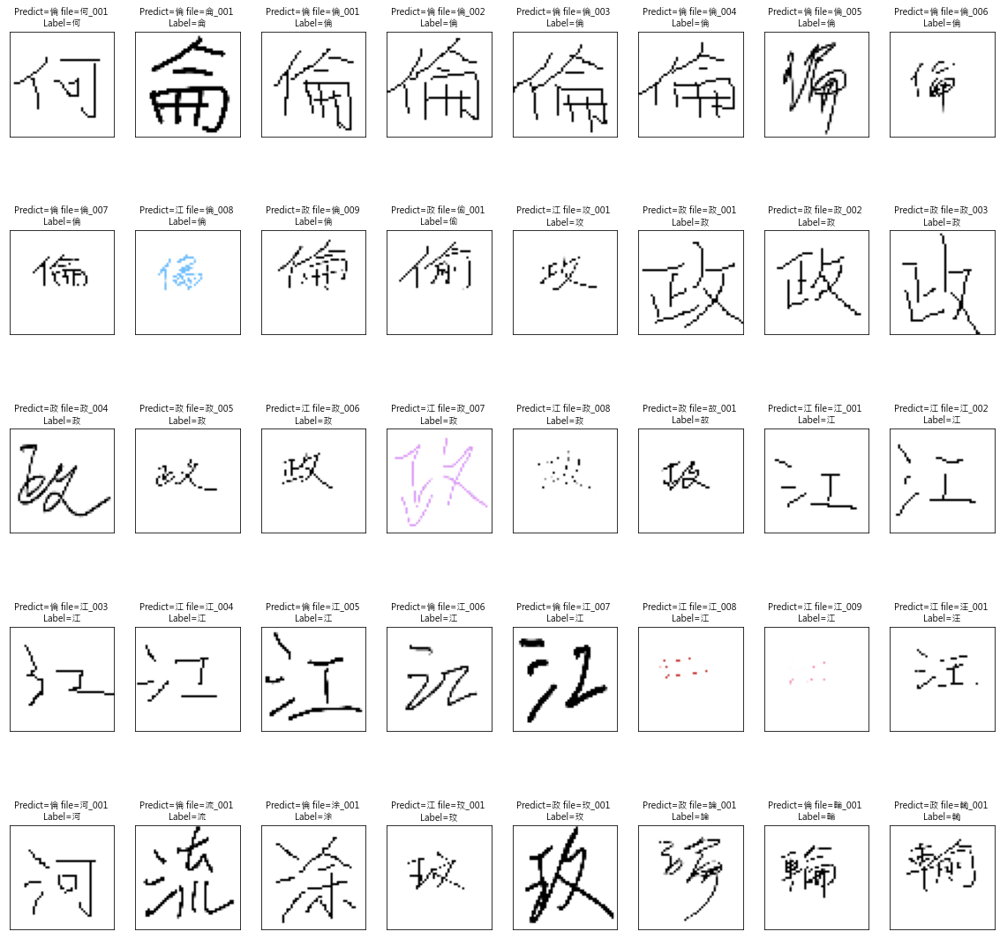

名單內準確率0.6538461538461539


In [ ]:
from keras.preprocessing import image

cnt = 0
temp = 0
for img, i in zip(sorted(os.listdir()), range(len(os.listdir()))):
    pic = load_img(img, target_size=(50, 50))
    wrd = img[0]
    test_image = np.expand_dims(image.img_to_array(pic), axis = 0)
    predict = CNN.predict(test_image)
    predict_wrd = '倫' if predict[0][0] == 1 else '政' if predict[0][1] == 1 else '江'
    name = img.split('.')[0]
    #計算圖片是名字而且預測正確的機率
    if (name.split('_')[0] == predict_wrd) & (wrd in ('江', '政', '倫')):
        cnt += 1
    if wrd in ('江', '政', '倫'):
        temp += 1
    plt.gcf().set_size_inches((20,20)) 
    ax = plt.subplot( 5, len(os.listdir())/5, i+1)   
    ax.imshow( pic )  
    ax.set_title( f'Predict={predict_wrd} file={name} \nLabel={wrd}', fontproperties=font )   
    ax.set_xticks([]); ax.set_yticks([]) 

plt.show() 
print(f'名單內準確率{cnt/temp}')

##用上次存的模型重做結果

#上傳模型


In [18]:
from google.colab import files
os.chdir( '/content' )
files.upload()

Saving CNN_3C.h5 to CNN_3C.h5


{'CNN_3C.h5': b'\x89HDF\r\n\x1a\n\x00\x00\x00\x00\x00\x08\x08\x00\x04\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x001*\x00\x00\x00\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\xa8\x02\x00\x00\x00\x00\x00\x00\x01\x00\x07\x00\x01\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x10\x00\x10\x00\x00\x00\x00\x00 \x03\x00\x00\x00\x00\x00\x00h\x01\x00\x00\x00\x00\x00\x00TREE\x00\x00\x01\x00\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

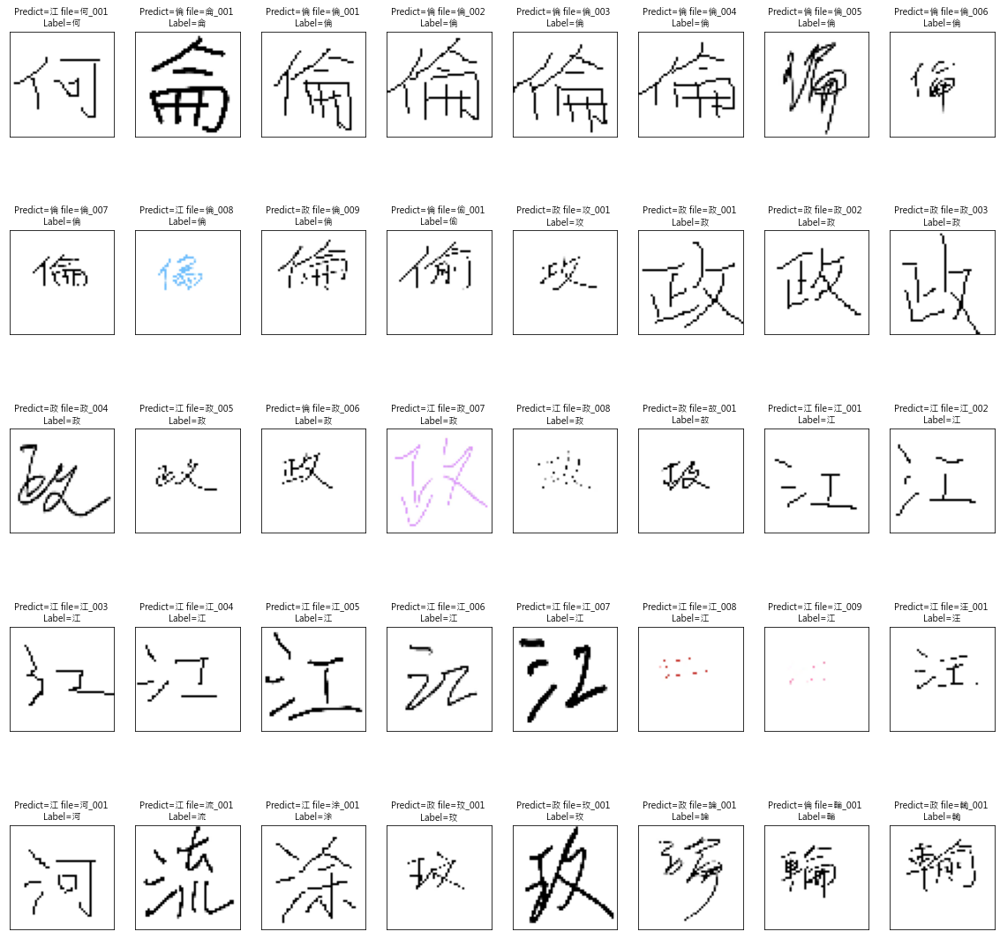

名單內準確率0.7692307692307693


In [ ]:
#跑模型
from keras.models import load_model
from keras.preprocessing import image

os.chdir( '/content' )
CNN = load_model('CNN_3C.h5')
CNN.compile( optimizer = Adam(),
             loss = 'categorical_crossentropy', 
             metrics = ['accuracy'] )

TestingDataPath = '/content/Traditional_Chinese_Testing_Data/Handwriting-Chinese-Characters-Recognition/test data'
os.chdir(TestingDataPath)

cnt = 0
temp = 0
for img, i in zip(sorted(os.listdir()), range(len(os.listdir()))):
    pic = load_img(img, target_size=(50, 50))
    wrd = img[0]
    test_image = np.expand_dims(image.img_to_array(pic), axis = 0)
    predict = CNN.predict(test_image)
    predict_wrd = '倫' if predict[0][0] == 1 else '政' if predict[0][1] == 1 else '江'
    name = img.split('.')[0]
    #計算圖片是名字而且預測正確的機率
    if (name.split('_')[0] == predict_wrd) & (wrd in ('江', '政', '倫')):
        cnt += 1
    if wrd in ('江', '政', '倫'):
        temp += 1
    plt.gcf().set_size_inches((20,20)) 
    ax = plt.subplot( 5, len(os.listdir())/5, i+1)   
    ax.imshow( pic )  
    ax.set_title( f'Predict={predict_wrd} file={name} \nLabel={wrd}', fontproperties=font )   
    ax.set_xticks([]); ax.set_yticks([]) 

plt.show() 
print(f'名單內準確率{cnt/temp}')

(1, 25, 25, 6)
(1, 25, 25, 10)
(1, 12, 12, 10)
(1, 12, 12, 20)
(1, 6, 6, 20)
(1, 6, 6, 20)
(1, 720)
(1, 512)
(1, 3)


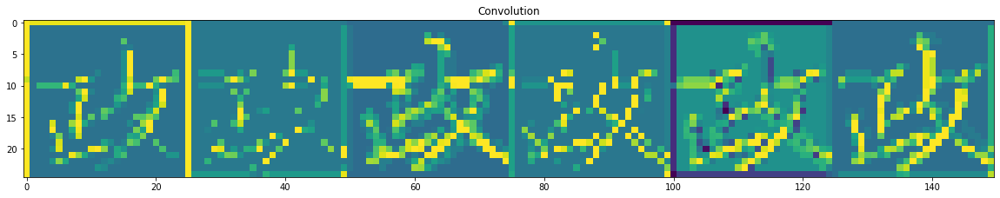

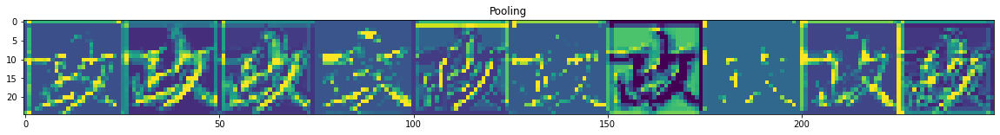

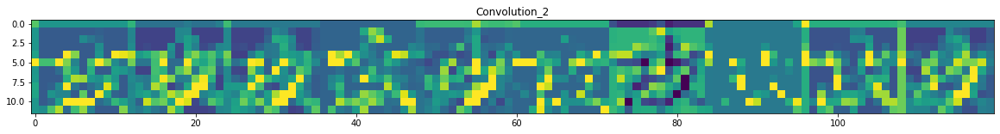

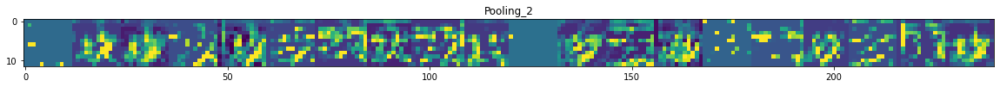

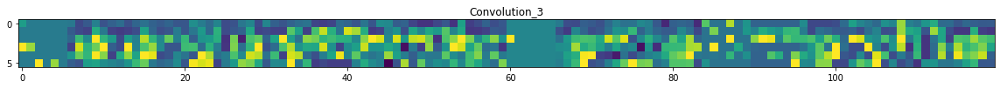

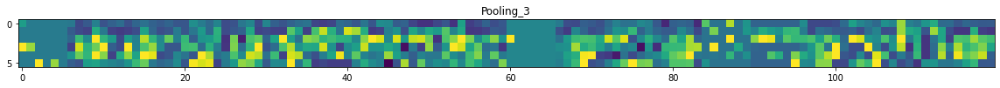

In [ ]:
pict = '政_001'
img_path= f'/content/Traditional_Chinese_Testing_Data/Handwriting-Chinese-Characters-Recognition/test data/{pict}.png'

successive_outputs = [layer.output for layer in CNN.layers[1:]]
#visualization_model = Model(img_input, successive_outputs)
visualization_model = tf.keras.models.Model(inputs = CNN.input, outputs = successive_outputs)
#Load the input image
img = load_img(img_path, target_size=(50, 50))


# Convert ht image to Array of dimension (150,150,3)
x   = img_to_array(img)                           
x   = x.reshape((1,) + x.shape)
# Rescale by 1/255
x /= 255.0
# Let's run input image through our vislauization network
# to obtain all intermediate representations for the image.
successive_feature_maps = visualization_model.predict(x)
# Retrieve are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in CNN.layers]
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  print(feature_map.shape)
  if len(feature_map.shape) == 4:
    
    # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers
   
    n_features = feature_map.shape[-1]  # number of features in the feature map
    size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)
    
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))
    
    # Postprocess the feature to be visually palatable
    for i in range(n_features):
      x  = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std ()
      x *=  64
      x += 128
      x  = np.clip(x, 0, 255).astype('uint8')
      # Tile each filter into a horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x
# Display the grid
    scale = 20. / n_features
    plt.figure( figsize=(scale * n_features, scale) )
    plt.title ( layer_name )
    plt.grid  ( False )
    plt.imshow( display_grid, aspect='auto', cmap='viridis' )